# Non_geo Charts

### Load Libraries and Data

In [38]:
import cuxfilter
import cudf

In [3]:
data = cudf.read_csv('/home/ajay/data/data.csv')

### Get day of year for additional processing

In [77]:
data['day_of_year'] = (data.day + (data.week-1)*7)

"""
data.groupby('year').week.max().to_pandas().to_dict() is
{2014: 52, 2015: 53, 2016: 53, 2017: 52}
"""
year_wise_week = data.groupby('year').week.max().to_pandas().to_dict()

year0 = 2014

# data['all_time_week'] = data.week + (data.year - year0)*

In [79]:
data['all_time_week'] = data.week + 52*(data.year - year0)

In [84]:
data.loc[data.query('year > 2015').index]['all_time_week'] += 1

In [72]:
((data.year - 2013)*data.week).value_counts()

72     201269
84     198008
60     188990
96     176438
120    163507
        ...  
7        6838
106      6222
1        6106
5        5230
159      3381
Length: 127, dtype: int32

In [40]:
data.head()

,trip_id,year,month,week,day,hour,usertype,gender,starttime,stoptime,...,from_station_name,latitude_start,longitude_start,dpcapacity_start,to_station_id,to_station_name,latitude_end,longitude_end,dpcapacity_end,day_of_year
0,2355134,2014,6,27,0,23,Subscriber,Male,2014-06-30 23:57:00,2014-07-01 00:07:00,...,Lincoln Ave & Belmont Ave,-9.759200e+06,5.151901e+06,15.0,303,Broadway & Cornelia Ave,-9.756706e+06,5.152821e+06,15.0,182
1,2355133,2014,6,27,0,23,Subscriber,Male,2014-06-30 23:56:00,2014-07-01 00:00:00,...,Halsted St & Maxwell St,-9.756812e+06,5.140716e+06,15.0,22,May St & Taylor St,-9.757764e+06,5.141449e+06,15.0,182
2,2355130,2014,6,27,0,23,Subscriber,Male,2014-06-30 23:33:00,2014-06-30 23:35:00,...,Sheffield Ave & Webster Ave,-9.757567e+06,5.149256e+06,19.0,225,Halsted St & Dickens Ave,-9.757023e+06,5.148994e+06,15.0,182
3,2355129,2014,6,27,0,23,Subscriber,Female,2014-06-30 23:26:00,2014-07-01 00:24:00,...,Peoria St & Jackson Blvd,-9.757113e+06,5.142684e+06,19.0,194,State St & Wacker Dr,-9.754677e+06,5.144091e+06,11.0,182
4,2355128,2014,6,27,0,23,Subscriber,Female,2014-06-30 23:16:00,2014-06-30 23:26:00,...,Loomis St & Lexington St,-9.758434e+06,5.141853e+06,15.0,134,Peoria St & Jackson Blvd,-9.757113e+06,5.142684e+06,19.0,182


## cuxfilter analysis

In [7]:
cux_df = cuxfilter.DataFrame.from_dataframe(data)

In [36]:
count_month = cuxfilter.charts.bar('month')
count_day = cuxfilter.charts.bar('day')
count_year = cuxfilter.charts.multi_select('year')
count_hour = cuxfilter.charts.bar('hour', title='trips per hour')

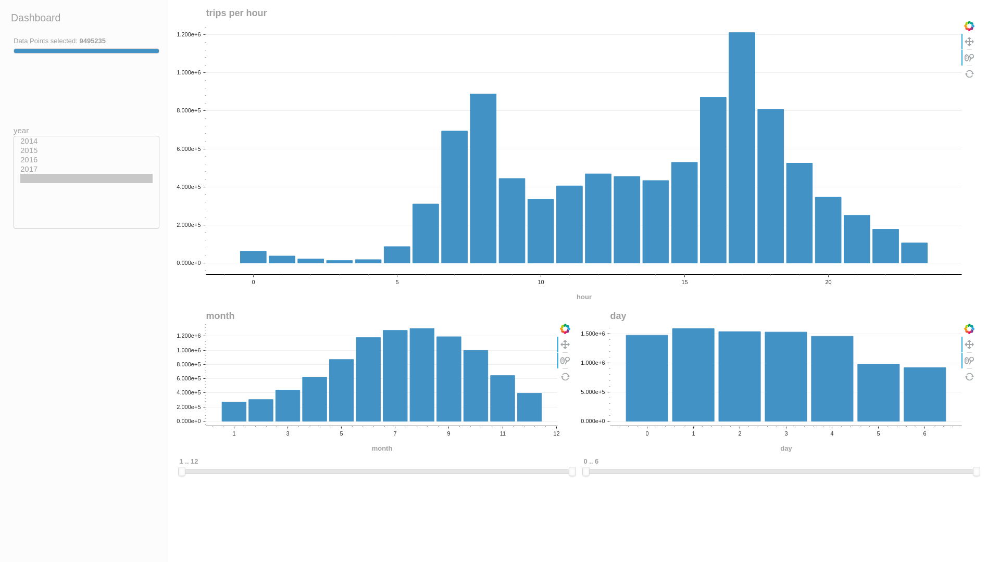

In [16]:
d = cux_df.dashboard([count_hour, chart0, chart1, chart2], layout=cuxfilter.layouts.feature_and_double_base)
await d.preview()
# d.show()

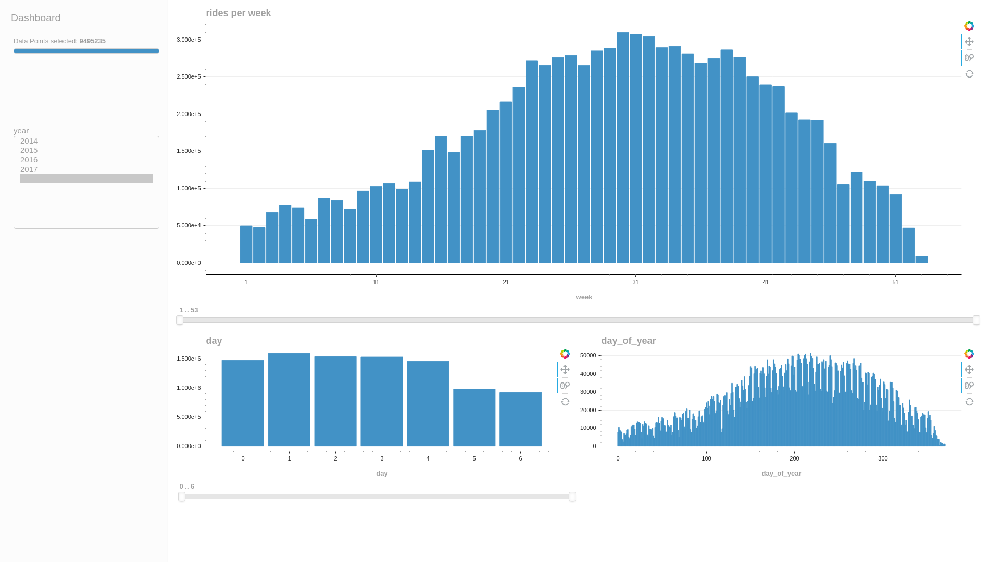

In [22]:
chart4 = cuxfilter.charts.bar(x='day_of_year', add_interaction=False,)

d = cux_df.dashboard([chart0, chart1, chart2, chart4], layout=cuxfilter.layouts.feature_and_double_base)
await d.preview()

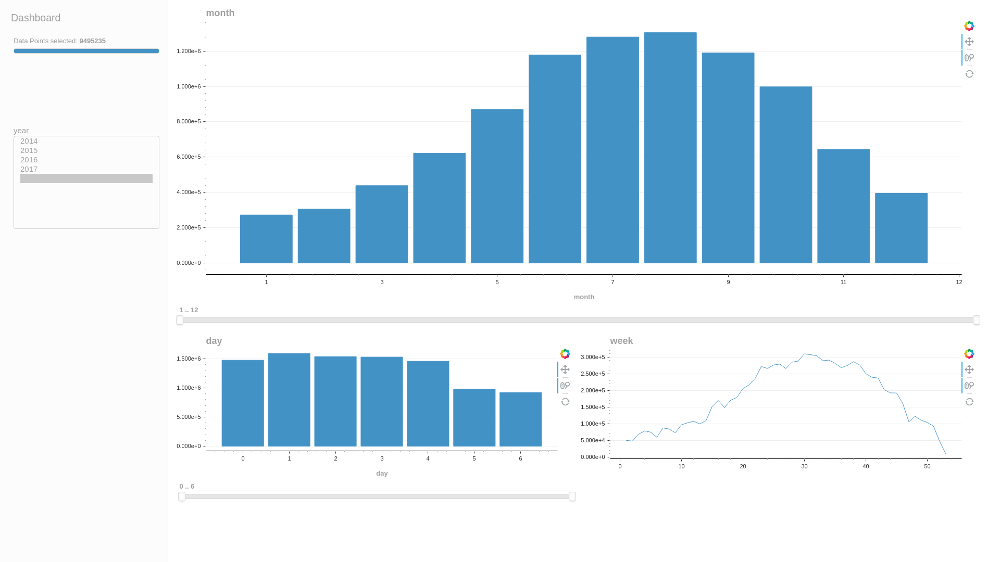

In [15]:
chart5 = cuxfilter.charts.line(x='week', add_interaction=False,)

d = cux_df.dashboard([chart0, chart1, chart2, chart5], layout=cuxfilter.layouts.feature_and_double_base)
await d.preview()
# d.show()

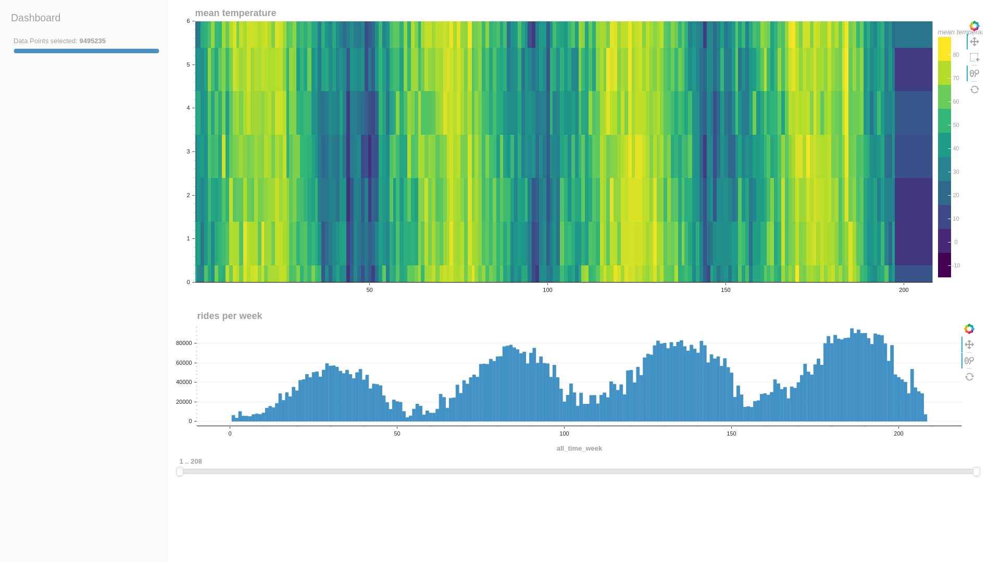

In [97]:
cux_df = cuxfilter.DataFrame.from_dataframe(data)


chart0 = cuxfilter.charts.bar('all_time_week', title='rides per week')
chart6 = cuxfilter.charts.heatmap(x='all_time_week', y='day', aggregate_col='temperature', aggregate_fn='mean', point_size=40, legend_position='right', title='mean temperature')

d = cux_df.dashboard([chart6, chart0], layout=cuxfilter.layouts.feature_and_base)

await d.preview()

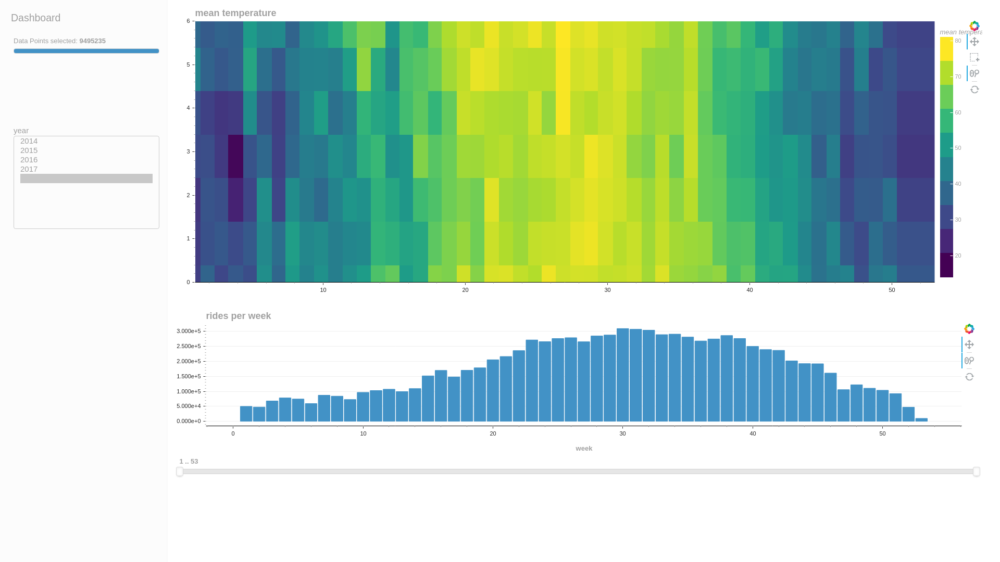

In [92]:
cux_df = cuxfilter.DataFrame.from_dataframe(data)


chart0 = cuxfilter.charts.bar('week', title='rides per week')
chart2 = cuxfilter.charts.multi_select('year')
chart6 = cuxfilter.charts.heatmap(x='week', y='day', aggregate_col='temperature', aggregate_fn='mean', point_size=40, legend_position='right', title='mean temperature')

d = cux_df.dashboard([chart6, chart0, chart2], layout=cuxfilter.layouts.feature_and_base)

await d.preview()

In [28]:
chart7 = cuxfilter.charts.bar('from_station_id')
chart8 = cuxfilter.charts.bar('to_station_id')

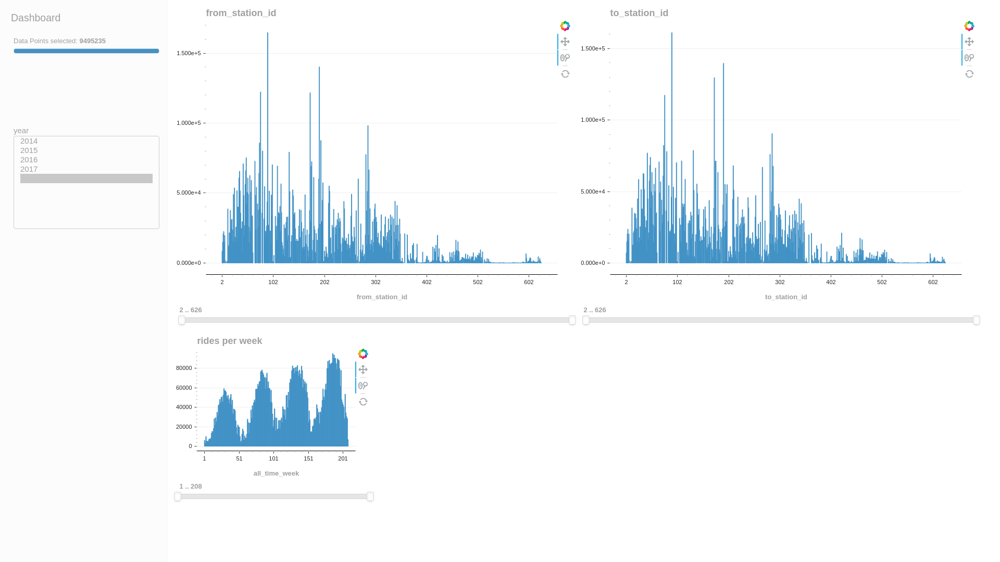

In [95]:
d = cux_df.dashboard([chart7, chart8, chart0, chart2], layout=cuxfilter.layouts.double_feature_quad_base)
await d.preview()